In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
random.seed(1)
%matplotlib inline
from matplotlib import *
from matplotlib.animation import FuncAnimation
plt.rcParams["animation.html"] = "jshtml"

In [2]:
x = np.random.rand(120)
c = 2.3
m = 1.5

y = m*x + c

In [3]:
fig = plt.figure()
ax = plt.axes(xlim=(0, 1), ylim=(0, 5))
plt.plot(x,y,'.')
line, = ax.plot([], [])
plt.close()

guess_w0 = 2
guess_w1 = 6

def loss_function(x,y,guess_w0,guess_w1):
    return np.sum((y - predicted_function(x,guess_w0,guess_w1))**2)/float(len(x))

def predicted_function(x,w0,w1):
    return w0+x*w1

def init():
    line.set_data(x,y)

def gradient_descent(i,guess_w0,guess_w1,x):
    lr = 0.1
    for _ in range(i):
        dLdw0 = -2*np.sum(y - predicted_function(x,guess_w0,guess_w1))/float(len(x))
        dLdw1 = -2*np.sum((y - predicted_function(x,guess_w0,guess_w1))*x)/float(len(x))
        guess_w0 -= lr* dLdw0
        guess_w1 -= lr* dLdw1
        line.set_data(x, guess_w0 + x*guess_w1)
    #print(guess_w0,guess_w1)
    return line,

anim = FuncAnimation(fig, gradient_descent, init_func=init,fargs=(guess_w0,guess_w1,x), frames=200,interval=20)
anim

In [4]:
w1 = np.arange(-0, 3, 0.025)
len(w1)
len(x)

120

In [5]:
len(np.linspace(0,10,num = (10/0.025)))

/home/ubuntu/src/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  """Entry point for launching an IPython kernel.


400

8000
8000


ValueError: Argument Z must be 2-dimensional.

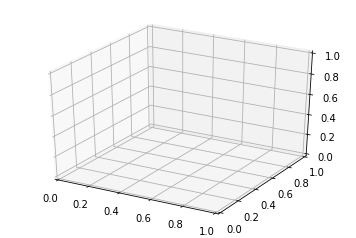

In [6]:
%matplotlib inline

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
l_lim = -1
r_lim = 3

x = np.random.rand(8000)
y1 = m*x + c
print(len(y1))
#w0 = np.arange(l_lim, r_lim, (r_lim - l_lim)/len(y))
#w1 = np.arange(l_lim, r_lim, (r_lim - l_lim)/len(y))
w0 = np.arange(-10, 10, 0.0025)
print(len(w0))
w1 = np.arange(-10, 10, 0.0025)
W0, W1 = np.meshgrid(w0, w1)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
loss = np.sum((y1 - (W0 + x*W1))**2/len(y1))

# Plot the surface.
surf = ax.plot_surface(W0, W1, loss, cmap=cm.coolwarm, linewidth=0, antialiased=False)
#surf = ax.plot_wireframe(w0, w1, loss, rstride=10, cstride=10)

In [ ]:
%matplotlib notebook


from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
l_lim = -1
r_lim = 3
#w0 = np.arange(l_lim, r_lim, (r_lim - l_lim)/len(y))
#w1 = np.arange(l_lim, r_lim, (r_lim - l_lim)/len(y))
w0 = np.arange(0, 3, 0.025)
w1 = np.arange(0, 3, 0.025)
W0, W1 = np.meshgrid(w0, w1)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
loss = (y - (W0 + x*W1))**2/len(y)
# Plot the surface.
#surf = ax.plot_surface(W0, W1, loss, cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax.plot(x, y, (y - (w0 + x*w1))**2/len(y) , label='parametric curve')
#surf = ax.plot_wireframe(w0, w1, loss, rstride=10, cstride=10)


In [7]:
np.multiply([2,2,2],W1).shape

ValueError: operands could not be broadcast together with shapes (3,) (8000,8000) 

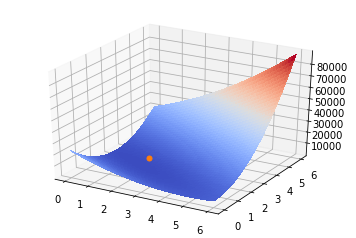

In [4]:
%matplotlib inline

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.gca(projection='3d')


def loss_function(x,y,guess_w0,guess_w1):
    return np.sum((y - predicted_function(x,guess_w0,guess_w1))**2)/float(len(x))

def predicted_function(x,w0,w1):
    return w0+x*w1

l_lim,r_lim = 0,6

w0 = np.arange(l_lim, r_lim, 0.0025)
w1 = np.arange(l_lim, r_lim, 0.0025)
W0, W1 = np.meshgrid(w0, w1)

x = np.sort(np.random.rand(len(w0)))
c,m = 2.3,1.5

y = m*x + c

guess_w0,guess_w1 = 6,6
#loss = np.array([np.sum((y - (w0 + x*w1)**2)**2) for w0 in W0 for w1 in W1])
loss = []
for w00 in w0:
    loss1 = []
    for w01 in w1:
        loss1.append(np.sum((y - (w00 + x*w01))**2))
    loss.append(loss1)

loss = np.array(loss)

# Plot the surface.
#print(len([guess_w0]),len([guess_w1]),len([loss]))
ax.plot_surface(W0, W1, loss, cmap=cm.coolwarm, linewidth=0, antialiased=False)
line, = ax.plot([guess_w0],[guess_w1],[loss_function(x,y,guess_w0,guess_w1)], marker='o', markersize=5)
#print(loss_function(x,y,guess_w0,guess_w1))


def init():
    xa,ya,za = [],[],[]
    
def gradient_descent(i,guess_w0,guess_w1,x,y):
    lr = 0.01
    for _ in range(i):
        dLdw0 = -2*np.sum(y - predicted_function(x,guess_w0,guess_w1))/float(len(x))
        dLdw1 = -2*np.sum((y - predicted_function(x,guess_w0,guess_w1))*x)/float(len(x))
        guess_w0 -= lr* dLdw0
        guess_w1 -= lr* dLdw1
    line.set_data([guess_w0],[guess_w1])
    line.set_3d_properties(np.sum((y - predicted_function(x,guess_w0,guess_w1))**2))
    #print(i,np.sum((y - predicted_function(x,guess_w0,guess_w1))**2),guess_w0, guess_w1)
    return line,

anim = FuncAnimation(fig, gradient_descent,init_func=init,fargs=(guess_w0,guess_w1,x,y), frames=200,interval=2)
anim


In [ ]:
loss.shape

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt

w0 = w1= np.arange(0, 6, 0.25)
#w1 = np.arange(l_lim, r_lim, 0.025)
W0, W1 = np.meshgrid(w0, w1,sparse=False)

x = np.sort(np.random.rand(len(w0)))
c,m = 2.3,1.5

y = m*x + c

print(x.shape,y.shape,W0.shape,W1.shape,loss.shape)

loss = (y - (W0 + np.multiply(x,W1)))**2/len(y)

fig1 = plt.figure(3)
ax1 = fig1.gca(projection='3d')
ax1.plot_surface(W0,W1,loss)
#ax1.plot(W0.T,W1.T)

In [ ]:
ch1 = np.arange(0,1,0.25)
ch2 = np.arange(0,4,1)
ch3,ch4 = np.meshgrid(ch1,ch2)
xch = [2,2,2,2]

ch4*xch + ch3


In [ ]:
%matplotlib inline

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.gca(projection='3d')


def loss_function(x,y,guess_w0,guess_w1):
    return np.sum((y - predicted_function(x,guess_w0,guess_w1))**2)/float(len(x))

def predicted_function(x,w0,w1):
    return w0+x*w1

l_lim,r_lim = 0,6

w0 = np.arange(l_lim, r_lim, 0.0025)
w1 = np.arange(l_lim, r_lim, 0.0025)
W0, W1 = np.meshgrid(w0, w1)

x = np.sort(np.random.rand(len(w0)))
c,m = 2.3,1.5

y = m*x + c

guess_w0,guess_w1 = 6,6
#loss = np.array([np.sum((y - (w0 + x*w1)**2)**2) for w0 in W0 for w1 in W1])
loss = []
for w00 in w0:
    loss1 = []
    for w01 in w1:
        loss1.append(np.sum((y - (w00 + x*w01))**2))
    loss.append(loss1)

loss = np.array(loss)

# Plot the surface.
print(len([guess_w0]),len([guess_w1]),len([loss]))
ax.plot_surface(W0, W1, loss, cmap=cm.coolwarm, linewidth=0, antialiased=False)
line, = ax.plot([guess_w0],[guess_w1],[loss_function(x,y,guess_w0,guess_w1)], marker='o', markersize=5)
print(loss_function(x,y,guess_w0,guess_w1))


def init():
    xa,ya,za = [],[],[]
    
def gradient_descent(i,guess_w0,guess_w1,x,y):
    lr = 0.01
    for _ in range(i):
        dLdw0 = -2*np.sum(y - predicted_function(x,guess_w0,guess_w1))/float(len(x))
        dLdw1 = -2*np.sum((y - predicted_function(x,guess_w0,guess_w1))*x)/float(len(x))
        guess_w0 -= lr* dLdw0
        guess_w1 -= lr* dLdw1
    line.set_data([guess_w0],[guess_w1])
    line.set_3d_properties(np.sum((y - predicted_function(x,guess_w0,guess_w1))**2))
    print(i,np.sum((y - predicted_function(x,guess_w0,guess_w1))**2),guess_w0, guess_w1)
    return line,

anim = FuncAnimation(fig, gradient_descent,init_func=init,fargs=(guess_w0,guess_w1,x,y), frames=200,interval=2)
anim


In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
w0 = w1= np.arange(0, 6, 0.25)
W0,W1 = np.meshgrid(w0,w1)

x = np.random.rand(len(w0))

zs = np.array([(W0 + W1*x) for W0,W1 in zip(np.ravel(W0), np.ravel(W1))])
#Z = zs.reshape(W0.shape)

ax.plot_surface(W0, W1, Z)
zs


In [ ]:
ax.add_line

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Grab some test data.
X, Y, Z = axes3d.get_test_data(0.05)

# Plot a basic wireframe.
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)

plt.show()


In [ ]:
loss

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

def error(m, b, points):
    totalError = 0
    for i in range(0, len(points)):
        totalError += (points[i].y - (m * points[i].x + b)) ** 2
    return totalError / float(len(points))

x = y = np.arange(-3.0, 3.0, 0.05)
Point = collections.namedtuple('Point', ['x', 'y'])

m, b = 3, 2
noise = np.random.random(x.size)
points = [Point(xp, m*xp+b+err) for xp,err in zip(x, noise)]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ms = np.linspace(2.0, 4.0, 10)
bs = np.linspace(1.5, 2.5, 10)

M, B = np.meshgrid(ms, bs)
zs = np.array([error(mp, bp, points) 
               for mp, bp in zip(np.ravel(M), np.ravel(B))])
Z = zs.reshape(M.shape)

ax.plot_surface(M, B, Z, rstride=1, cstride=1, color='b', alpha=0.5)

ax.set_xlabel('m')
ax.set_ylabel('b')
ax.set_zlabel('error')

plt.show()

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Grab some test data.
X, Y, Z = axes3d.get_test_data(0.05)

# Plot a basic wireframe.
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)



In [ ]:
import mxnet as mx

In [ ]:
mx.__version__

In [ ]:
from __future__ import print_function
import mxnet as mx
import numpy as np
from mxnet import nd, autograd, gluon


data_ctx = mx.cpu()
model_ctx = mx.cpu()
# model_ctx = mx.gpu(1)


num_inputs = 784
num_outputs = 10
batch_size = 64
num_examples = 60000
def transform(data, label):
    return data.astype(np.float32)/255, label.astype(np.float32)
train_data = gluon.data.DataLoader(mx.gluon.data.vision.MNIST(train=True, transform=transform),
                                      batch_size, shuffle=True)
test_data = gluon.data.DataLoader(mx.gluon.data.vision.MNIST(train=False, transform=transform),
                                     batch_size, shuffle=False)

#######################
#  Set some constants so it's easy to modify the network later
#######################
num_hidden = 256
weight_scale = .01

#######################
#  Allocate parameters for the first hidden layer
#######################
W1 = nd.random_normal(shape=(num_inputs, num_hidden), scale=weight_scale, ctx=model_ctx)
b1 = nd.random_normal(shape=num_hidden, scale=weight_scale, ctx=model_ctx)

#######################
#  Allocate parameters for the second hidden layer
#######################
W2 = nd.random_normal(shape=(num_hidden, num_hidden), scale=weight_scale, ctx=model_ctx)
b2 = nd.random_normal(shape=num_hidden, scale=weight_scale, ctx=model_ctx)

#######################
#  Allocate parameters for the output layer
#######################
W3 = nd.random_normal(shape=(num_hidden, num_outputs), scale=weight_scale, ctx=model_ctx)
b3 = nd.random_normal(shape=num_outputs, scale=weight_scale, ctx=model_ctx)

params = [W1, b1, W2, b2, W3, b3]

for param in params:
    param.attach_grad()
    
def softmax(y_linear):
    exp = nd.exp(y_linear-nd.max(y_linear))
    partition = nd.nansum(exp, axis=0, exclude=True).reshape((-1, 1))
    return exp / partition

def cross_entropy(yhat, y):
    return - nd.nansum(y * nd.log(yhat), axis=0, exclude=True)

def relu(X):
    return nd.maximum(X, nd.zeros_like(X))

def softmax_cross_entropy(yhat_linear, y):
    return - nd.nansum(y * nd.log_softmax(yhat_linear), axis=0, exclude=True)

def net(X):
    #######################
    #  Compute the first hidden layer
    #######################
    h1_linear = nd.dot(X, W1) + b1
    h1 = relu(h1_linear)

    #######################
    #  Compute the second hidden layer
    #######################
    h2_linear = nd.dot(h1, W2) + b2
    h2 = relu(h2_linear)

    #######################
    #  Compute the output layer.
    #  We will omit the softmax function here
    #  because it will be applied
    #  in the softmax_cross_entropy loss
    #######################
    yhat_linear = nd.dot(h2, W3) + b3
    return yhat_linear

def SGD(params, lr):
    for param in params:
        param[:] = param - lr * param.grad
        
def evaluate_accuracy(data_iterator, net):
    numerator = 0.
    denominator = 0.
    for i, (data, label) in enumerate(data_iterator):
        data = data.as_in_context(model_ctx).reshape((-1, 784))
        label = label.as_in_context(model_ctx)
        output = net(data)
        predictions = nd.argmax(output, axis=1)
        numerator += nd.sum(predictions == label)
        denominator += data.shape[0]
    return (numerator / denominator).asscalar()

epochs = 2
learning_rate = .001
smoothing_constant = .01

for e in range(epochs):
    cumulative_loss = 0
    for i, (data, label) in enumerate(train_data):
        data = data.as_in_context(model_ctx).reshape((-1, 784))
        label = label.as_in_context(model_ctx)
        label_one_hot = nd.one_hot(label, 10)
        with autograd.record():
            output = net(data)
            loss = softmax_cross_entropy(output, label_one_hot)
        loss.backward()
        SGD(params, learning_rate)
        cumulative_loss += nd.sum(loss).asscalar()


    test_accuracy = evaluate_accuracy(test_data, net)
    train_accuracy = evaluate_accuracy(train_data, net)
    print("Epoch %s. Loss: %s, Train_acc %s, Test_acc %s" %
          (e, cumulative_loss/num_examples, train_accuracy, test_accuracy))

<IPython.core.display.Javascript object>


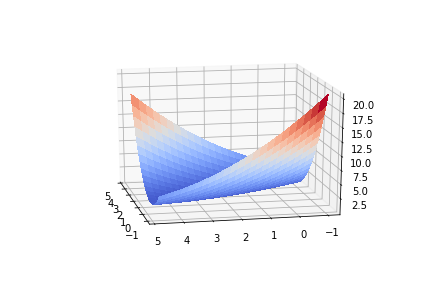

In [37]:
%matplotlib notebook
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt


fig1 = plt.figure()
ax1 = fig1.gca(projection='3d')


def loss_function(x,y,guess_w0,guess_w1):
    return np.sum((y - predicted_function(x,guess_w0,guess_w1))**2)/float(len(x))

def predicted_function(x,w0,w1):
    return w0+x*w1

l_lim,r_lim = -1,5

w0 = np.arange(l_lim, r_lim, 0.25)
w1 = np.arange(l_lim, r_lim, 0.25)
W0, W1 = np.meshgrid(w0, w1)

x = np.sort(np.random.rand(len(w0)))
c,m = 2.3,1.5

y = m*x + c

guess_w0,guess_w1 = 6,6
#loss = np.array([np.sum((y - (w0 + x*w1)**2)**2) for w0 in W0 for w1 in W1])
loss = []
w0_a = []
w1_a = []
for w00 in w0:
    loss1 = []
    w1_a1 = []
    w0_a0 = []
    for w01 in w1:
        loss1.append(np.sum((y - (w00 + x*w01))**2)/len(y))
        w0_a0.append(np.array(w00))
        w1_a1.append(np.array(w01))
    loss.append(loss1)
    w0_a.append(w0_a0)
    w1_a.append(w1_a1)

loss = np.array(loss)

# Plot the surface.
#print(len([guess_w0]),len([guess_w1]),len([loss]))
ax1.plot_surface(w0_a, w1_a, loss, cmap=cm.coolwarm, linewidth=0, antialiased=False)

In [36]:
for l,i in enumerate(loss):
    print(l,i)

0 [ 26.22127275  24.36986987  22.5891949   20.87924784  19.24002869
  17.67153746  16.17377414  14.74673873  13.39043124  12.10485166  10.89
   9.74587625   8.67248041   7.66981249   6.73787248   5.87666038]
1 [ 23.74022146  21.9781737   20.28685386  18.66626193  17.11639791
  15.63726181  14.22885362  12.89117335  11.62422098  10.42799654   9.3025
   8.24773138   7.26369067   6.35037787   5.50779299   4.73593602]
2 [ 21.38417017  19.71147754  18.10951283  16.57827602  15.11776714
  13.72798616  12.4089331   11.16060796   9.98301073   8.87614141   7.84
   6.87458651   5.97990093   5.15594326   4.40271351   3.72021167]
3 [ 19.15311887  17.56978137  16.05717179  14.61529012  13.24413636
  11.94371052  10.71401259   9.55504257   8.46680047   7.44928628   6.5025
   5.62644164   4.82111119   4.08650865   3.42263403   2.82948732]
4 [ 17.04706758  15.55308521  14.12983075  12.77730421  11.49550559
  10.28443487   9.14409207   8.07447718   7.07559021   6.14743115   5.29
   4.50329677   3.78732

In [16]:
np.sum((y - (200 + x*-200))**2)

20313233.234673746

In [17]:
np.sum((y - (-20 + x*20))**2)

315651.17259806331

In [19]:
np.sum((y - (2 + x*1.6))**2)

100.95917265844683

In [20]:
np.sum((y - (200 + x*200))**2)

147516768.43493348